In the following article, we would explore the internal representation and working of a convolutional neural network. Here, we use DenseNet architecture and the illustration is made using Keras with Tensorflow backend.  We initialize the base model using DenseNet121 architecture and load it with weights of the same model pretrained with ImageNet.

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import keras
import tensorflow as tf
import numpy as np
import time
from IPython.display import Image
from scipy.misc import imsave

In [0]:
from keras import applications
from keras import backend as K
from keras.applications.densenet import DenseNet121, preprocess_input, decode_predictions

# Don't pre-allocate memory; allocate as-needed
config = tf.ConfigProto()
config.gpu_options.allow_growth = True

# Create a session with the above options specified.
K.tensorflow_backend.set_session(tf.Session(config=config))

In [0]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [0]:
# code segment to authenticate google drive.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [18]:
# Loading the model with fully connected layer.
model_fc = applications.DenseNet121(include_top=True, weights='imagenet') 
model_fc.summary()

34119680/34115984 [==============================] - 4s 0us/step


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
zero_padding2d_5 (ZeroPadding2D (None, 230, 230, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_5[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
__________________________________________________________________________________________________
conv1/relu

Using the above output, we could determine the number of filters in each layer. This would be helpful in training and displaying the filters for any convolutional layer in the model. However, we remove the fully connected layer for the purpose of training. Keeping fully connected layer requires us to pass image with the default size of 224x224. However, we pass 128x128 randomly initialized image which is enough to represent what a filter is looking for in the input image and also it takes less time duration. This 128x128 image is finally displayed in order to perceive what does a filter in the network expects in the image in order to get itself activated.

In [22]:
# Model without fully connected layer - used for visual analysis
model = applications.DenseNet121(include_top=False, weights='imagenet') 
layer_dict = dict([(layer.name, layer) for layer in model.layers])
layer_dict

{'bn': <keras.layers.normalization.BatchNormalization at 0x7f3037b50780>,
 'conv1/bn': <keras.layers.normalization.BatchNormalization at 0x7f303fad42e8>,
 'conv1/conv': <keras.layers.convolutional.Conv2D at 0x7f303fad4a90>,
 'conv1/relu': <keras.layers.core.Activation at 0x7f303faaebe0>,
 'conv2_block1_0_bn': <keras.layers.normalization.BatchNormalization at 0x7f303fac3828>,
 'conv2_block1_0_relu': <keras.layers.core.Activation at 0x7f303ea55cc0>,
 'conv2_block1_1_bn': <keras.layers.normalization.BatchNormalization at 0x7f303ea19e80>,
 'conv2_block1_1_conv': <keras.layers.convolutional.Conv2D at 0x7f303e9a7828>,
 'conv2_block1_1_relu': <keras.layers.core.Activation at 0x7f303e960ef0>,
 'conv2_block1_2_conv': <keras.layers.convolutional.Conv2D at 0x7f303e8f4400>,
 'conv2_block1_concat': <keras.layers.merge.Concatenate at 0x7f303e9319b0>,
 'conv2_block2_0_bn': <keras.layers.normalization.BatchNormalization at 0x7f303e8c3c50>,
 'conv2_block2_0_relu': <keras.layers.core.Activation at 0x7f3

This model has 121 convolution layers which reside within several blocks. The visual representation of what the network learns can be determined by visualizing the filters that look for the features in the input image. Here, since the model is pretrained, the filters look for the certain features that activate it the maximum. In order to view what kind of patterns in the image activate a particular filter, we start with a randomly initialized gray image with pixel values centered around 128 and train the image to capture the patterns the filter looks using optimization.  The loss function defined for this purpose maximizes the activation using the gradient ascent process. Here, the gradients are allowed to update the input image for a user-defined number of iterations.

In [6]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, None, None, 6 9408        zero_padding2d_1[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, None, None, 6 256         conv1/conv[0][0]                 
__________________________________________________________________________________________________
conv1/relu


__________________________________________________________________________________________________
conv5_block10_1_conv (Conv2D)   (None, None, None, 1 102400      conv5_block10_0_relu[0][0]       
__________________________________________________________________________________________________
conv5_block10_1_bn (BatchNormal (None, None, None, 1 512         conv5_block10_1_conv[0][0]       
__________________________________________________________________________________________________
conv5_block10_1_relu (Activatio (None, None, None, 1 0           conv5_block10_1_bn[0][0]         
__________________________________________________________________________________________________
conv5_block10_2_conv (Conv2D)   (None, None, None, 3 36864       conv5_block10_1_relu[0][0]       
__________________________________________________________________________________________________
conv5_block10_concat (Concatena (None, None, None, 8 0           conv5_block9_concat[0][0]        
         

###Various DenseNet architectures

The following table shows various DenseNet architectures. Here, we use DenseNet-121 architecture. There are 4 major dense blocks with each block consisting of several sub-blocks of 1x1 and 3x3 convolutions. In the following article, we maximize the activations of these convolutions and view the results for analysis.

![Various DenseNet architectures ](https://i.imgur.com/oiTdqJL.jpg)

### Utility Functions

In [0]:
# Function to normalize the tensor usinf L2
def normalize(x):
  return x / (K.sqrt(K.mean(K.square(x))) + K.epsilon())

In [0]:
# Function to convert a tensor into a valid image
def deprocess_image(x):
    # normalize tensor: center on 0 with std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip  values to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x


In [0]:
# Function for optimizing the filters with predefined number of steps. In most of the cases we use 50 iterations.

def optimize_filters(layer_name, steps, num_of_filters, consider_intial_loss = True):
  input_img = model.input
  img_width = img_height =  128
  kept_filters = []
  for filter_index in range(num_of_filters):
    layer_output = layer_dict[layer_name].output
    #loss = layer_output[:, filter_index]
    loss = K.mean(layer_output[:, :, :, filter_index])
    grads = K.gradients(loss, input_img)[0]
    grads = normalize(grads)
    iterate = K.function([input_img], [loss, grads])
  
    # we start from a gray image with some random noise
    input_img_data = np.random.random((1, img_width, img_height, 3))
    input_img_data = (input_img_data - 0.5) * 20 + 128
    step = 1
  
    # gradient ascent for predefined number of steps
    for i in range(steps):
      start_time = time.time()
      loss_value, grads_value = iterate([input_img_data])
      input_img_data += grads_value * step
      
      # we can optionally omit this step considering initial loss value
      if consider_intial_loss:
        if loss_value <= 0:
          #some filters get stuck to 0, we can skip them
          break

    print('Current loss value:', loss_value)
    # decode the resulting input image
    if loss_value > 0:
      img = deprocess_image(input_img_data)
      kept_filters.append((img, loss_value))
    
    end_time = time.time()
    print('Filter %d processed in %ds' % (filter_index, end_time - start_time))
    
  return kept_filters
  

In [0]:
# Function for displaying the filters of a selected layer.

def display_filters(kept_filters, n, layer_name, steps):
  
  img_width = img_height = 128
  kept_filters.sort(key=lambda x: x[1], reverse=True)
  kept_filters = kept_filters[:n * n]
  
  # build a black picture with enough space for filters of size 128 x 128, with a 5px margin in between
  margin = 5
  width = n * img_width + (n - 1) * margin
  height = n * img_height + (n - 1) * margin
  stitched_filters = np.zeros((width, height, 3))

  # fill the picture with our saved filters
  for i in range(n):
     for j in range(n):
         if (i * n + j) < len(kept_filters):
            img, loss = kept_filters[i * n + j]
            stitched_filters[(img_width + margin) * i: (img_width + margin) * i + img_width,
                           (img_height + margin) * j: (img_height + margin) * j + img_height, :] = img

  
  if('/' in layer_name):
    layer_name = layer_name.partition('/')[0]
  print(layer_name)
  
  # save the result to disk
  imsave('filters_%s_%dsteps_%dx%d.png' %(layer_name, steps, n, n), stitched_filters)

In [34]:
# To save the filter images in google drive.
from os import listdir
from os.path import isfile, join

filters_to_save = [f for f in listdir('/content') if isfile(join('/content', f))]
for filter in filters_to_save:
  uploaded = drive.CreateFile({'title': filter})
  uploaded.SetContentFile(filter)
  uploaded.Upload()
  print('Uploaded file with ID {}'.format(uploaded.get('id')))

Uploaded file with ID 1NGyNn5zhA1MlT7brK-unxVklwUDKYfQx
Uploaded file with ID 1fpC_0w4fTGCsM7Ugj6q74QLGRRgAKa4p


Filters in the initial layer learn very fundamental aspects of an image such as colors, vertical and horizontal edges. In the below representation, the filters learn colors such as rose, purple, green and blue colors and few filters learn either horizontal or vertical edges. Whereas, few filters learn square patches with a gray shaded background.

### First convolutional layer

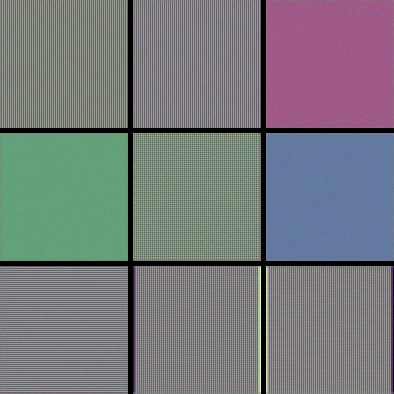

In [60]:
## First convolution layer
# layer_name = 'conv1/conv'
# kept_filters = optimize_filters(layer_name,50,16)
# display_filters(kept_filters, 3, layer_name, steps)
Image(filename='filters_conv1_50steps_3x3.png')

###Filters in dense block 1

The first two layers represent fundamental features with basic textures.

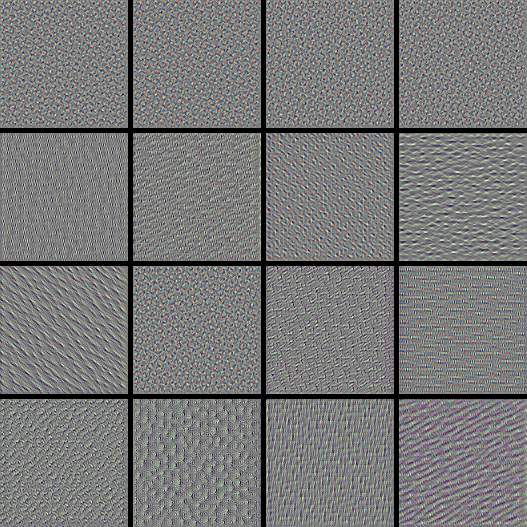

In [32]:
## Filters in dense block 1  - First layer - with 1x1 convolution
# layer_name = 'conv2_block1_1_conv'
# kept_filters = optimize_filters(layer_name,50,64)
# display_filters(kept_filters, 4, layer_name, steps)
Image(filename='filters_conv2_block1_1_conv_50steps_4x4.png')

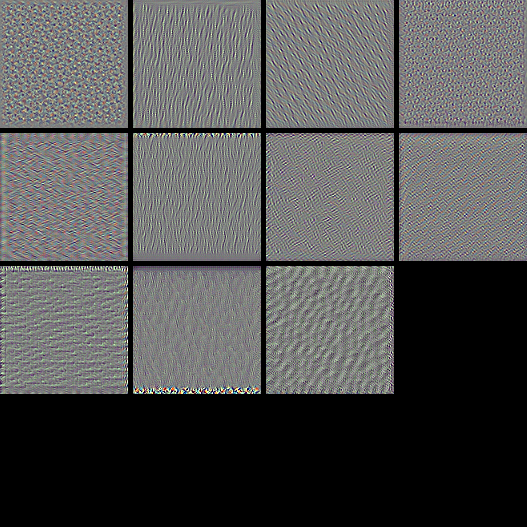

In [26]:
## Filters in dense block 1- First layer - with 3x3 convolution
# layer_name = 'conv2_block1_2_conv'
# kept_filters = optimize_filters(layer_name,50,32)
# display_filters(kept_filters, 4, layer_name, steps)

Image(filename='filters_conv2_block1_2_conv_50steps_4x4.png')

Visualizing the filters of foremost 1x1 and 3x3 convolution layers in the first dense block reveals the fact of how well similar filters of 1x1 convolution layer are aggregated into a single and relevant filter in the 3x3 convolution layer. For example, the filters of the first row in the former layer is similar to first and last filters of the first row in the current filter grid.  Moreover, we could also find few filters in the current grid resemble that of zoomed in version of filters of 1x1 convolution layer. This could have happened possibly due to 3x3 convolutions that map each pixel in the current layer to 9 pixels in the previous layer. 

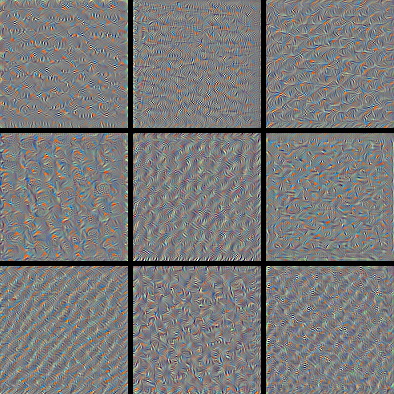

In [37]:
## First dense block - Last layer - 1x1 convolution
# layer_name = 'conv2_block6_1_conv'
# kept_filters = optimize_filters(layer_name,50,128)
# display_filters(kept_filters, 3, layer_name, steps)
Image(filename='filters_conv2_block6_1_conv_50steps_3x3.png')

The same above filter is trained for 50 more iterations to see if any visible difference it makes. However, there is only a limited difference between these filter grids. 

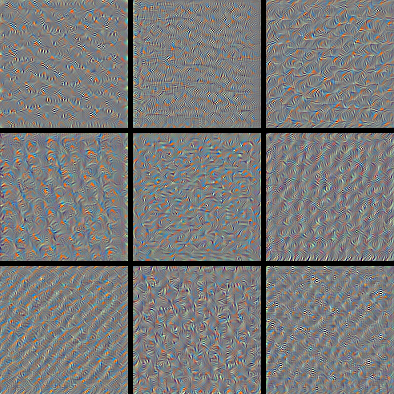

In [43]:
## First dense block - Last layer - 1x1 convolution - 100 iterations
# layer_name = 'conv2_block6_1_conv'
# kept_filters = optimize_filters(layer_name,100,128)
# display_filters(kept_filters, 3, layer_name, steps)
Image(filename='filters_conv2_block6_1_conv_100steps_3x3.png')

In the last 2 filter grids, we find training the same layer for 50 more iterations does not necessarily make any remarkable change to the filters. But, could find out few prominent edges in their texture thus, providing more clarity on which edges and corners of the texture activate a particular filter relatively higher than the other edges. 

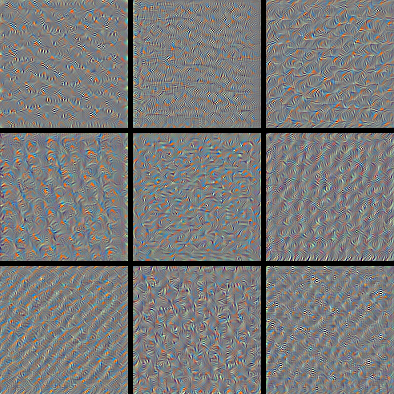

In [59]:
## First dense block - Last layer - 3x3 convolution
# layer_name = 'conv2_block6_2_conv'
# kept_filters = optimize_filters(layer_name,50,32)
# display_filters(kept_filters, 3, layer_name, steps)
Image(filename='filters_conv2_block6_2_conv_50steps_3x3.png')

The filters of 1x1 and 3x3 convolution layer closely resemble each other except for the fact that there exist only 32 filters in 3x3 convolution layer whereas it accounts to 128 filters in the 1x1 convolution layer. The following 2 grids display an exhaustive list of filters from the above layers (these filters are generated by allowing the model to maximize activation of filter even when the initial loss value is less than 0). 

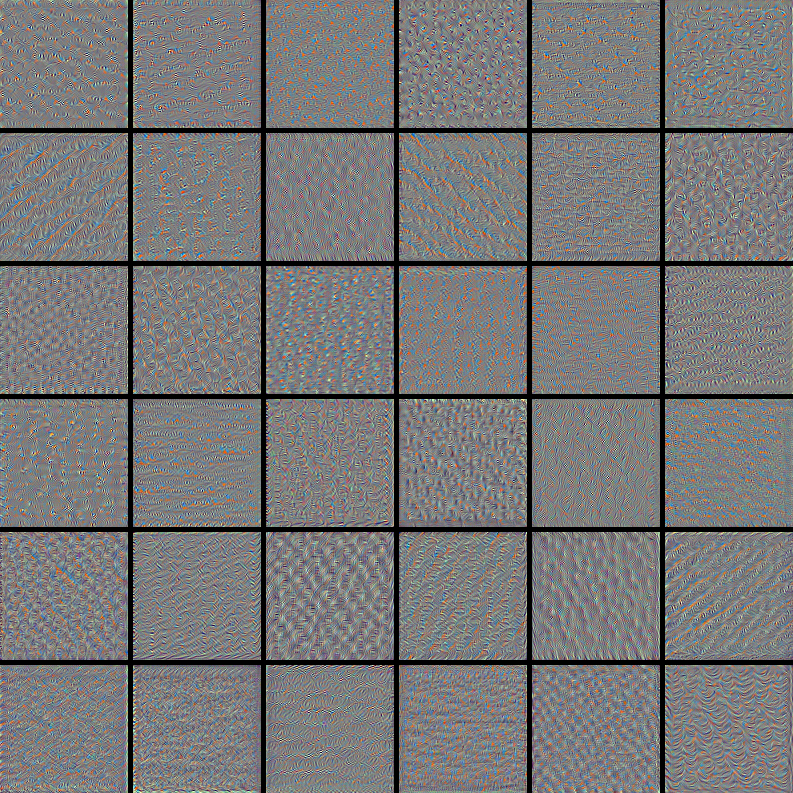

In [85]:
# The following grid displays just 50 out of 128 filters from 1x1 convolution layer.

## First block - Last layer - 1x1 convolution
# layer_name = 'conv2_block6_1_conv'
# kept_filters = optimize_filters(layer_name,50,128,False)
# display_filters(kept_filters, 6, layer_name, steps)
Image(filename='filters_conv2_block6_1_conv_all_kernels_50steps_6x6.png')

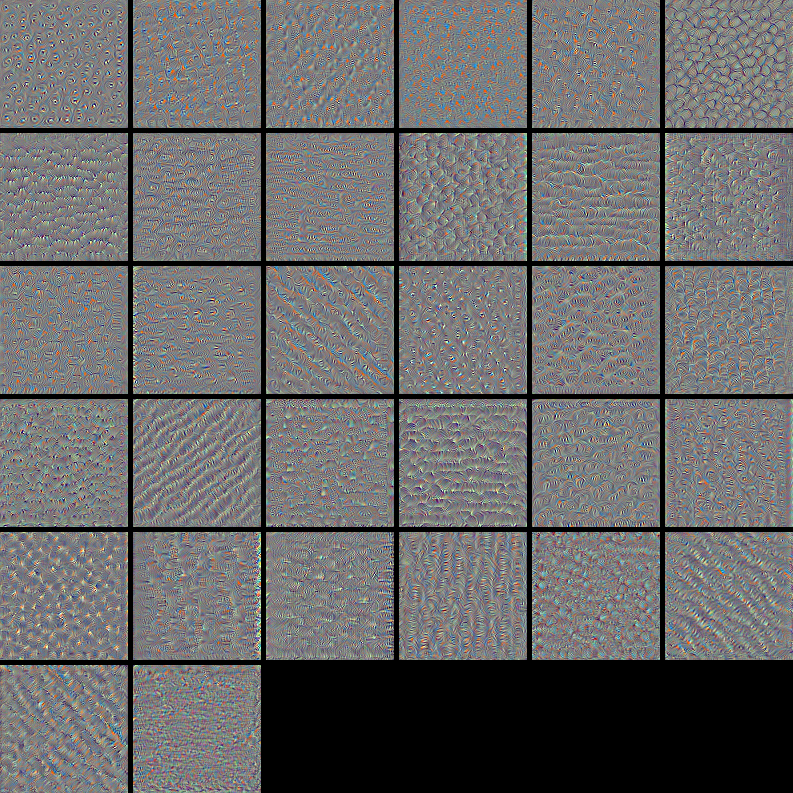

In [72]:
# This grid displays the final 32 filters of the first dense block.

## First block - Last layer - 3x3 convolution
# layer_name = 'conv2_block6_2_conv'
# kept_filters = optimize_filters(layer_name,50,32,False)
# display_filters(kept_filters, 6, layer_name, steps)
Image(filename='filters_conv2_block6_2_conv_all_kernels_50steps_6x6.png')

By the end of first dense block, the filters are able to learn several minute patterns combining the inital fundamental features to create different textures containing various shapes and curve/edge orientations.

###Filters in dense block 2

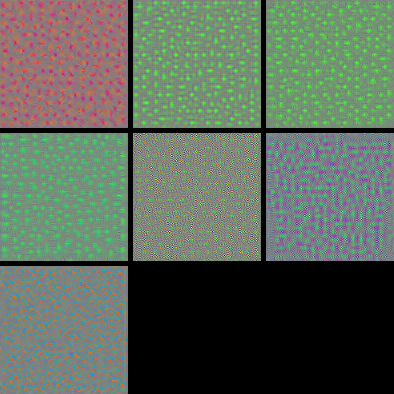

In [56]:
## Filters in Dense Block 2 - First layer - with 1x1 convolution
# layer_name = 'conv3_block1_1_conv'
# kept_filters = optimize_filters(layer_name,50,128)
# display_filters(kept_filters, 3, layer_name, steps)
Image(filename='filters_conv3_block1_1_conv_all_50steps_3x3.png')

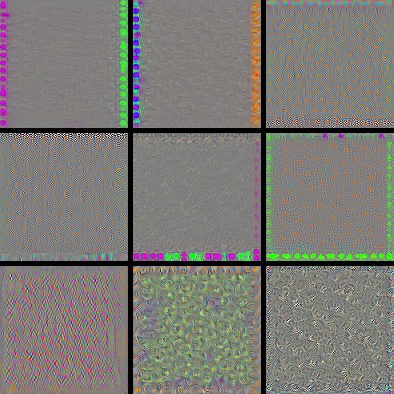

In [62]:
## Filters in Dense Block 2 - First layer -  with 3x3 convolution
# layer_name = 'conv3_block1_2_conv'
# kept_filters = optimize_filters(layer_name,50,32)
# display_filters(kept_filters, 3, layer_name, steps)
Image(filename='filters_conv3_block1_2_conv_all_50steps_3x3.png')

The first convolution layer of dense block learns various colorful spots embedded on differently colored background at each filter.  These patterns represented here are more elementary in the nature.  The subsequent 3x3 convolution layer aggregates features in similar filters into 32 filters. Moreover, here filters have subtle patterns that are not so clearly prominent and look blurred.

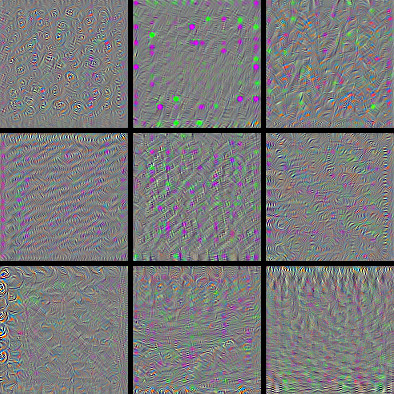

In [79]:
## Filters in Dense Block 2 - Middle (7th) layer -  with 3x3 convolution
# layer_name = 'conv3_block7_2_conv'
# kept_filters = optimize_filters(layer_name,50,32)
# display_filters(kept_filters, 3, layer_name, steps)
Image(filename='filters_conv3_block7_2_conv_all_50steps_3x3.png')

The seventh/middle layer contains a relatively clearer representation of patterns. Also, it contains few purple and green spots spread widely across most of the filters. Going by the presence of these spots in the first layer of this dense block, it is obvious to find these spots randomly present across the filters here as the subsequent layers are connected to each of the previous layer in a DenseNet block directly.  Moreover, the blurring effect could also be due to the shaded effect that the filters learn from the filters of previous convolution layer. 

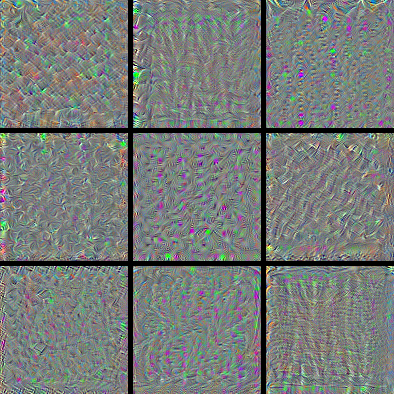

In [95]:
## Filters in Dense Block 2 - Last (12th) layer -  with 3x3 convolution
# layer_name = 'conv3_block12_2_conv'
# kept_filters = optimize_filters(layer_name,50,32)
# display_filters(kept_filters, 3, layer_name, steps)
Image(filename='filters_conv3_block12_2_conv_all_50steps_3x3.png')

The last layer of the second dense block looks pretty much similar to the output of first dense block. However, these filters are distinguishable from the former by incorporating visible green and purple spots and mixture of mild greyish color within the filter which are learnt from filters of previous layers of the same dense block. But, this filter has learned to mix the background and colored spots appropriately and so they do not look overwhelmingly filled only with these patterns as found in previous layers.

###Filters in dense block 3

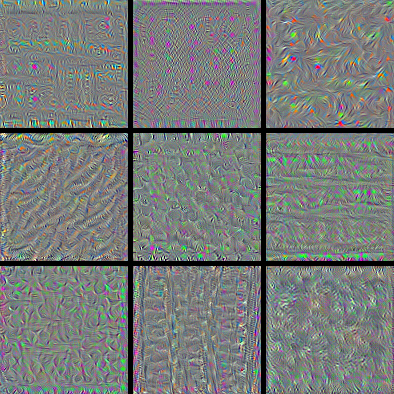

In [21]:
## Filters in Dense Block 3 - First layer -  with 1x1 convolution
# layer_name = 'conv4_block1_1_conv'
# kept_filters = optimize_filters(layer_name,50,16)
# display_filters(kept_filters, 4, layer_name, steps)
Image(filename='filters_conv4_block1_1_conv_all_50steps_3x3.png')

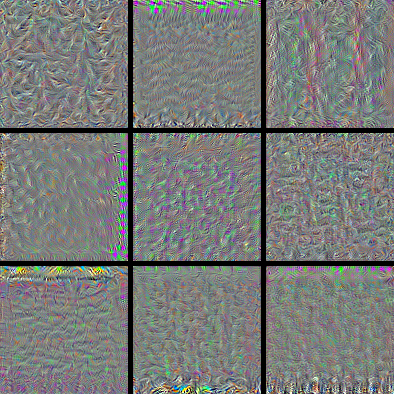

In [55]:
## Filters in Dense Block 3 - First layer - with 3x3 convolution
# layer_name = 'conv4_block1_2_conv'
# kept_filters = optimize_filters(layer_name,50,32)
# display_filters(kept_filters, 3, layer_name, steps)

Image(filename='filters_conv4_block1_2_conv_all_50steps_3x3.png')

In the first two convolution layers of third dense block, the orientation of the features in the filters are clearly evident and few newly formed patterns are clearly noticeable too. Unlike most of the previous dense block layers, the filters in this layer could represent two different orientations in the same filter. For example, looking into 3rd filter in the 3x3 convolution layer in the above grid, we find a red pattern representing predominantly vertical flow whereas the alternate edges flow in horizontal or diagonal directions. 

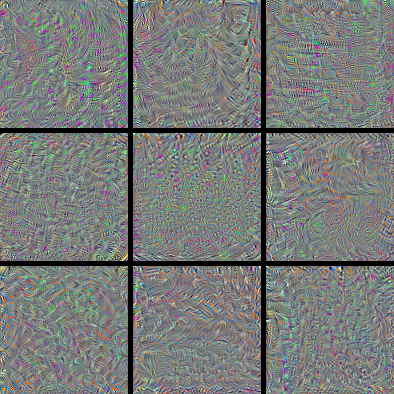

In [71]:
## Filters in Dense Block 3 - Middle layer -  with 3x3 convolution
# layer_name = 'conv4_block13_2_conv'
# kept_filters = optimize_filters(layer_name,50,32)
# display_filters(kept_filters, 3, layer_name, steps)

Image(filename='filters_conv4_block13_2_conv_all_50steps_3x3.png')


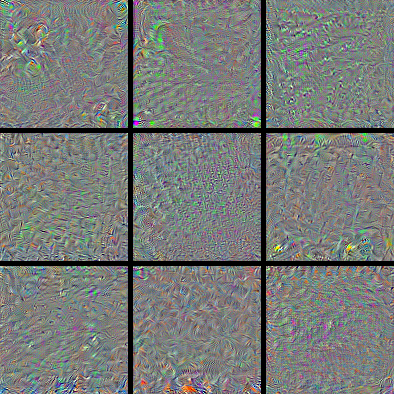

In [84]:
## Filters in Dense Block 3 - Last layer - with 3x3 convolution
# layer_name = 'conv4_block24_2_conv'
# kept_filters = optimize_filters(layer_name,50,32)
# display_filters(kept_filters, 3, layer_name, steps)

Image(filename='filters_conv4_block24_2_conv_all_50steps_3x3.png')

The above 2 layers contains filters that contain textures containing 2 regions where one part is fine grained and holds more granular features while the other region is occupied by a bigger pattern and these filters could activate an image with features having both granular and bigger features. Visually these two grids are almost identical. But, the last layer of this dense block has the bigger patterns more prominently visible. 

###Filters in dense block 4

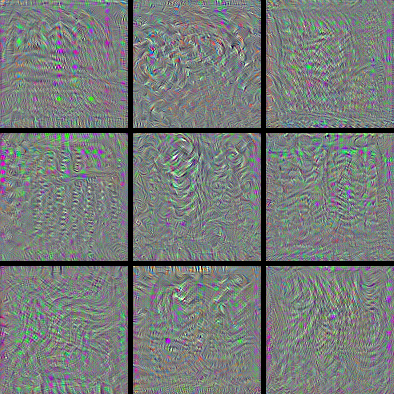

In [30]:
## Filters in Dense Block 4 - First layer - with 3x3 convolution
# layer_name = 'conv5_block1_2_conv'
# kept_filters = optimize_filters(layer_name,50,32)
# display_filters(kept_filters, 3, layer_name, steps)

Image(filename='filters_conv5_block1_2_conv_all_50steps_3x3.png')

The first 3x3 convolution layer of the last dense block visually resembles a colorful grid straightened, twisted, coiled and stretched at different filters.  For example, the middle most filter in the above grid could activate a coiled structure with in an image. 

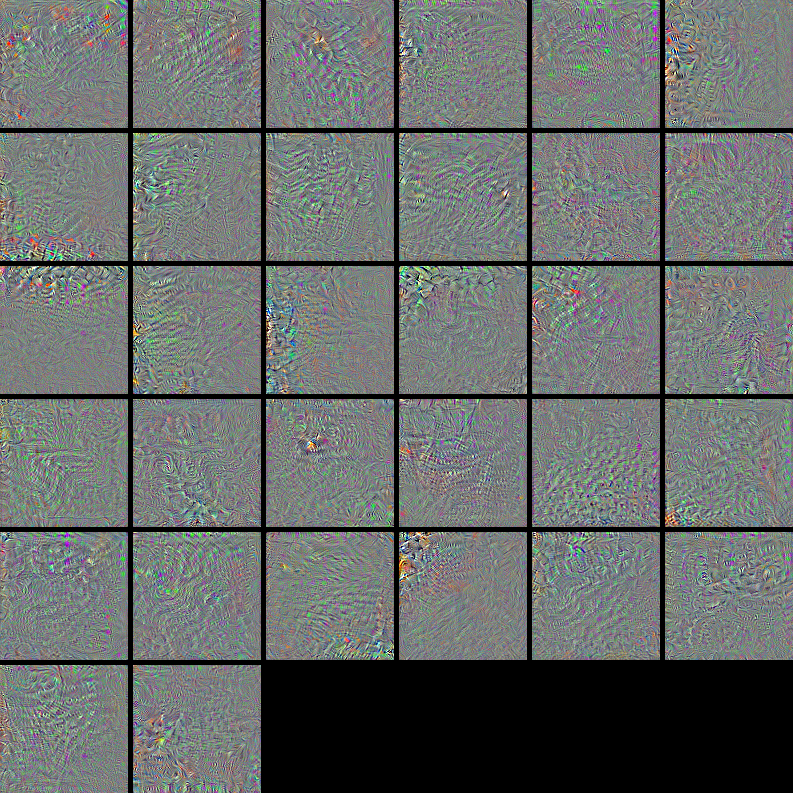

In [31]:
## Filters in Dense Block 4 - Last layer - with 3x3 convolution
# layer_name = 'conv5_block16_2_conv'
# kept_filters = optimize_filters(layer_name,50,32)
# display_filters(kept_filters, 3, layer_name, steps)

Image(filename='filters_conv5_block9_2_conv_all_50steps_6x6.png')

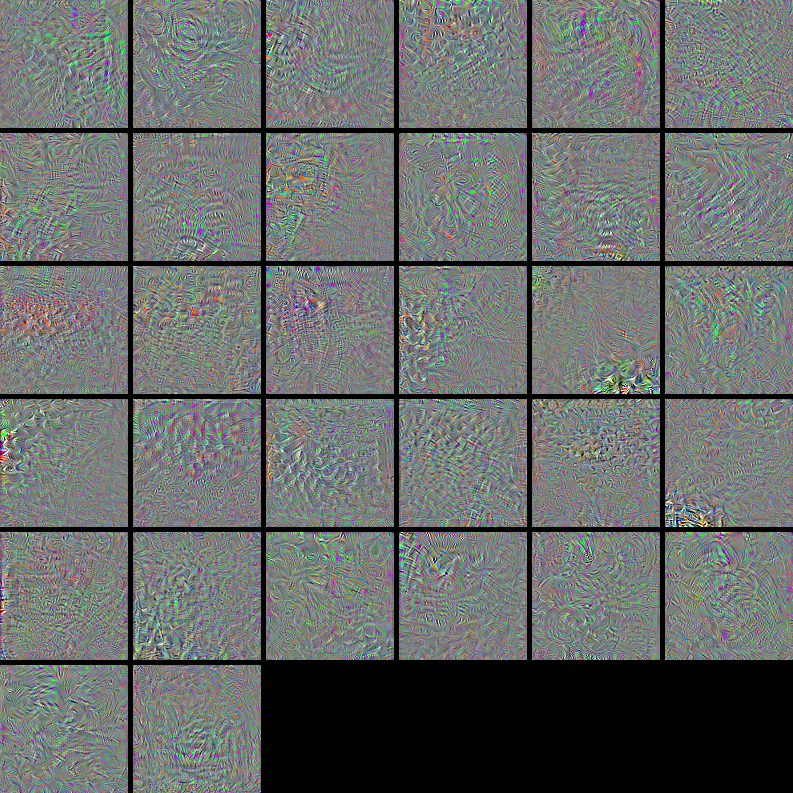

In [44]:
## Filters in Dense Block 4 - Last layer - with 3x3 convolution
# layer_name = 'conv5_block16_2_conv'
# kept_filters = optimize_filters(layer_name,50,32)
# display_filters(kept_filters, 3, layer_name, steps)

Image(filename='filters_conv5_block16_2_conv_all_50steps_6x6.png')

Mush similar to the previous dense block, this dense block also contains similar appearance for middle and last 3x3 convolution layer. But they are much different than the first 3x3 convolution layer of this dense block. These filters do not directly represent any particular object present in the world. But, these patterns could activate images having similar structure. Moreover, these filters represent more complicated patterns that combine diverse features that the model had learnt in the initial and subsequent layers. Also, the division of bigger and granular features is clearly discernible and looks more natural too. 

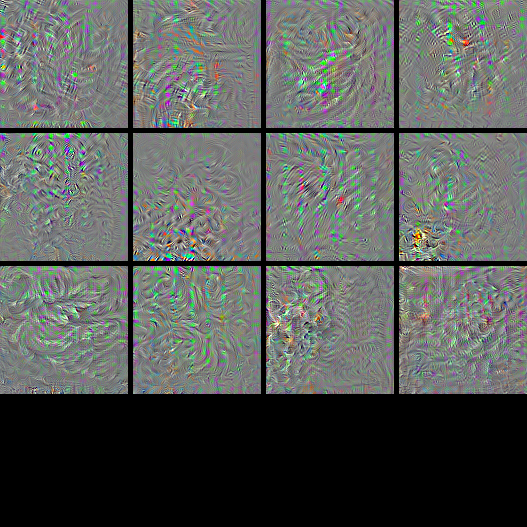

In [41]:
Image(filename='filters_conv5_block16_2_conv_500steps_4x4.png')

Training 12 filters of the final convolution layer for 500 iterations provide a slightly different view. Each filter represents diverse patterns with blurred borders with more prominently represented features in the central area made of several wavy and flowing vibrant patterns. Here, predominant features are highlighted than the 50-iteration counterpart. 

###Summary

With the above visualizations, we find filters of the initial layers trying to learn low-level features and moving towards the high-level layers, filters tend to learn relatively complicated features and also learns to incorporate and mix or interleave these features appropriately. Thus, higher layer filters learn evolved and high-level features that would help detecting parts of individual objects or even objects itself. Using optimization process for activation maximization does not necessarily represent the object itself but, a structure that could represent or detect a particular object. However, in the lower layers, the filters represent features and textures with which an object would be composed or made. 